# Statistical Analyisis of HazardDabatase 
#### @author: JALT and JM


# Review or Earthquake Hazard Scenarios

## Import Libraries

In [1]:
import json
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from datetime import datetime
import sys
import glob
import csv


sys.path.append('../')  # reference to relative path
import SeismicHazardReviewKernel as Functions1
from IPython.display import display, HTML

import geopandas as gpd
from shapely.geometry import Point

#import geodatasets
import contextily as cx

#to fine nearest points based on lat.lon
from scipy.spatial import distance



## 1. Read datafiles


In [2]:

#1. Read the configuration (.json) file which contains things that may change
jsonName = "SeismicHazardReviewConfig.json"
config = json.load(open(jsonName, encoding='utf-8'))

# 2. data access
print("  Loading inputs...", datetime.now())

# 2.1 read the information from the config file...
# ...for input
inputhEQ = config['inputs']['inputpathEQ']
cityPointsPath=config['inputs']['filenameEQ']['cityPointsPath']
number_of_Points_ERC=config['inputs']['paramvalues_Earthquake']['number_of_Points_ERC']
Min_intensity=config['inputs']['paramvalues_Earthquake']['Min_intensity']
Max_intensity=config['inputs']['paramvalues_Earthquake']['Max_intensity']
event_set_size_years=config['inputs']['paramvalues_Earthquake']['event_set_size_years']
time_frame_years=config['inputs']['paramvalues_Earthquake']['time_frame_years']

# ... for output (at the end)
writeOutput = config['outputs']['write']
outpath = config['outputs']['outputpath']
outputfilename = config['outputs']['outputfilename']
NumberofScenariostoExport = config['outputs']['NumberofScenariostoExport']

#Read .csv files of Seismic events in Long Format 
# List of .csv files in the current directory
csv_EQ_files = glob.glob(inputhEQ + '/*.csv')

#List of city of which I will compute the especific ERC
ListcityPoints = pd.read_csv(cityPointsPath)
ListcityPoints2 = ListcityPoints.copy()
ListcityPoints.head()

# List to hold dataframes (cvs files)
dfs = []

# Read each .csv file and append it to our list
for csv_file in csv_EQ_files:
    df = pd.read_csv(csv_file)
    dfs.append(df)

# Concatenate all dataframes in the list
combined_df = pd.concat(dfs, ignore_index=True)

# Display the combined dataframe
display(combined_df)




  Loading inputs... 2023-08-07 18:13:58.058950


,Lat,Long,Name,Event,PGA,Mag
0,22.588,121.163,141_1,M5.8_PGA0.16,0.100,5.8
1,22.568,121.163,141_1,M5.8_PGA0.16,0.101,5.8
2,22.548,121.163,141_1,M5.8_PGA0.16,0.102,5.8
3,22.528,121.163,141_1,M5.8_PGA0.16,0.103,5.8
4,22.508,121.163,141_1,M5.8_PGA0.16,0.103,5.8
...,...,...,...,...,...,...
19657256,21.928,121.543,169_81,M6.5_PGA0.11.1,0.100,6.5
19657257,22.128,121.563,169_81,M6.5_PGA0.11.1,0.100,6.5
19657258,22.108,121.563,169_81,M6.5_PGA0.11.1,0.100,6.5
19657259,22.088,121.563,169_81,M6.5_PGA0.11.1,0.100,6.5


## Create the event set Escenarios of EQ

In [3]:
# Step 1: Group the rows(which are points) by 'Events
grouped_by_event = combined_df.groupby(['Name'])     #'Event'

#Visualizar grouped_by_name
for key, item in grouped_by_event:
    print(grouped_by_event.get_group(key), "\n\n")


# Step 2: Create a list of EventData objects
event_objects = []
#for event_name, rows in data.groupby('Event'):
#for event_name, rows in grouped_by_event['Event']:
for event_name, rows in grouped_by_event:
    event_objects.append(Functions1.Class_Data_Scenario(event_name, rows))

for i in range(len(event_objects)):
        event_objects[i].event= event_objects[i].rowsData.iloc[0]['Event']


#Number of EQ Scenarios
display('Number of EQ Scenarios:' + str(len(event_objects)))

# Display the first EventData object to verify
first_event = event_objects[0]
print('Fist event')
display(first_event.event_name)
display(first_event.event)  
display(first_event.rowsData)


             Lat     Long Name         Event    PGA  Mag
13402061  25.249  120.863  0_1  M7.0_PGA0.90  0.100  7.0
13402062  25.229  120.863  0_1  M7.0_PGA0.90  0.101  7.0
13402063  25.209  120.863  0_1  M7.0_PGA0.90  0.101  7.0
13402064  25.189  120.863  0_1  M7.0_PGA0.90  0.102  7.0
13402065  25.169  120.863  0_1  M7.0_PGA0.90  0.102  7.0
...          ...      ...  ...           ...    ...  ...
13405320  25.089  122.242  0_1  M7.0_PGA0.90  0.109  7.0
13405321  25.069  122.242  0_1  M7.0_PGA0.90  0.107  7.0
13405322  25.049  122.242  0_1  M7.0_PGA0.90  0.105  7.0
13405323  25.029  122.242  0_1  M7.0_PGA0.90  0.103  7.0
13405324  25.009  122.242  0_1  M7.0_PGA0.90  0.101  7.0

[3264 rows x 6 columns] 


             Lat     Long  Name         Event  PGA  Mag
13429974  25.009  120.044  0_10  M6.0_PGA1.77  0.1  6.0
13429975  24.989  120.044  0_10  M6.0_PGA1.77  0.1  6.0
13429976  24.969  120.044  0_10  M6.0_PGA1.77  0.1  6.0
13429977  24.949  120.044  0_10  M6.0_PGA1.77  0.1  6.0
13429978

'Number of EQ Scenarios:13953'

Fist event


'0_1'

'M7.0_PGA0.90'

,Lat,Long,Name,Event,PGA,Mag
13402061,25.249,120.863,0_1,M7.0_PGA0.90,0.100,7.0
13402062,25.229,120.863,0_1,M7.0_PGA0.90,0.101,7.0
13402063,25.209,120.863,0_1,M7.0_PGA0.90,0.101,7.0
13402064,25.189,120.863,0_1,M7.0_PGA0.90,0.102,7.0
13402065,25.169,120.863,0_1,M7.0_PGA0.90,0.102,7.0
...,...,...,...,...,...,...
13405320,25.089,122.242,0_1,M7.0_PGA0.90,0.109,7.0
13405321,25.069,122.242,0_1,M7.0_PGA0.90,0.107,7.0
13405322,25.049,122.242,0_1,M7.0_PGA0.90,0.105,7.0
13405323,25.029,122.242,0_1,M7.0_PGA0.90,0.103,7.0


## Compute the Exccedance Rate of Accelerations

Location: (21.688, 117.966)
             Lat     Long   Name         Event    PGA  Mag
15899583  21.688  117.966  0_745  M7.5_PGA4.23  0.103  7.5
Location: (21.688, 117.966)
Exceedance Rate Curve: [0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0, 0.0, 0.0, 0.0, 0.0]


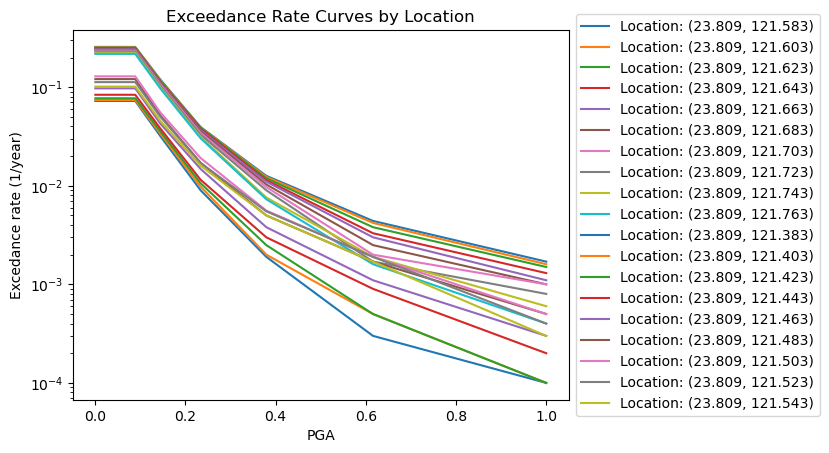

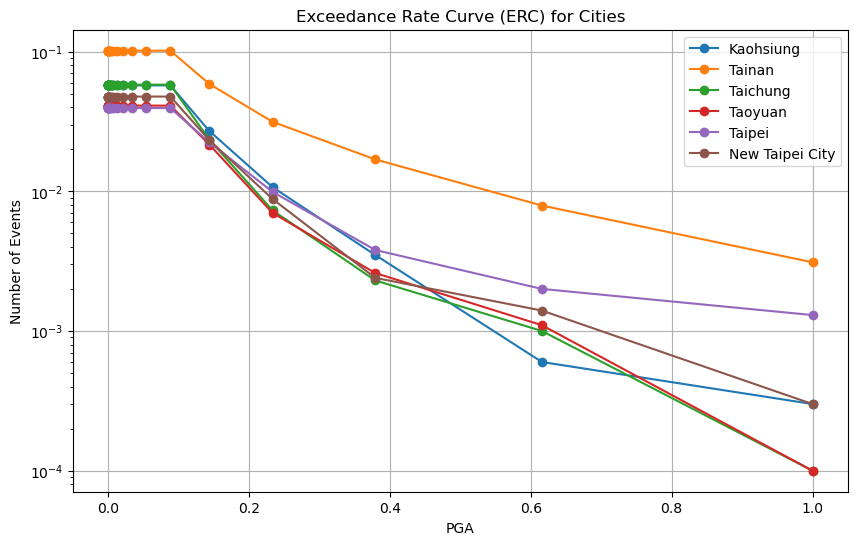

In [4]:
#Compute the exccedance curve for each Lat, Long Point 
erc_dict = Functions1.computeERC_EQ(combined_df,number_of_Points_ERC, Min_intensity, Max_intensity,event_set_size_years)


# Assigning the ERC to each city based on the closest location
ListcityPoints['ERC'] = ListcityPoints.apply(lambda row: erc_dict[Functions1.closest_point((row['lat'], row['lon']), erc_dict.keys())], axis=1)
ListcityPoints.head()



# Plot the exceedance rate curves
#vectorPGA = np.linspace(Min_intensity, Max_intensity, number_of_Points_ERC)  # just to Plot"
vectorPGA = np.logspace(np.log10(Min_intensity), np.log10(Max_intensity), number_of_Points_ERC)
#vectorPGA = [0.001, 0.1, 0.5]

for location, erc in erc_dict.items():
    print(f'Location: {location}')
    print(f'Exceedance Rate Curve: {erc}')
    break

# Create a figure and axes
fig, ax = plt.subplots()

# Get the 10 curve before and afther the location with the maximun frec of ocurrence of the database 
# Extract the key with the maximum value
max_key = max(erc_dict, key=lambda x: max(erc_dict[x]))

# Once extracted the key with the max value, extract the index of the key with the maximum value
keys_list = list(erc_dict.keys())
index_max_key = keys_list.index(max_key)

first_10 = list(erc_dict.items())[index_max_key:index_max_key+10]
last_10 = list(erc_dict.items())[index_max_key-10:index_max_key-1]

# Loop over each location and its exceedance rate curve
for location, erc in first_10 + last_10:
    # Plot the exceedance rate curve
    ax.plot(vectorPGA, erc, label=f'Location: {location}')

# Set the title and labels
ax.set_title('Exceedance Rate Curves by Location')
ax.set_xlabel('PGA')
ax.set_ylabel('Excedance rate (1/year)')      #'Number of Events with PGA >= x' / event set size

ax.set_yscale('log')

# Add a legend
ax.legend()

# Show the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()



#Plot the exccedance rate curve for specific cities
plt.figure(figsize=(10, 6))
for index, row in ListcityPoints.iterrows():
    plt.plot(vectorPGA, row['ERC'], label=row['city'], marker='o')

plt.title('Exceedance Rate Curve (ERC) for Cities')
plt.xlabel('PGA')
plt.ylabel('Number of Events')
plt.legend()
plt.grid(True)
plt.yscale('log')
plt.show()




## Compute the Annual Probability of Exceedance of Intensities

Location: (21.688, 117.966)
Annual Probability of Exceedance: [0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.00498752080731768, 0.0, 0.0, 0.0, 0.0, 0.0]


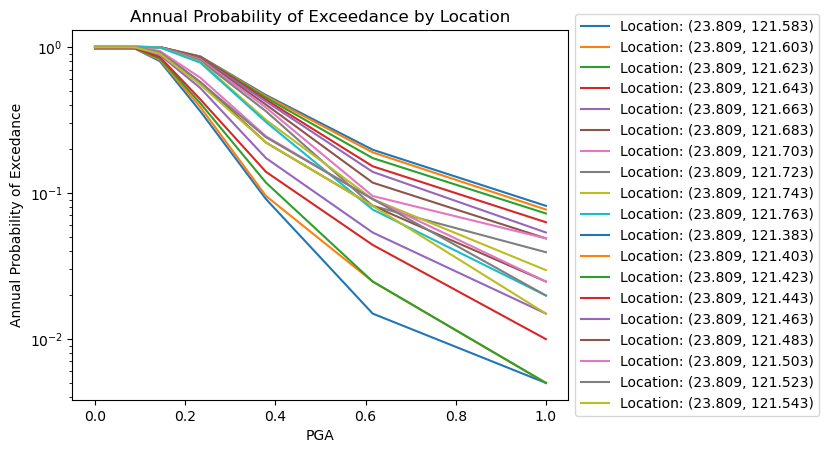

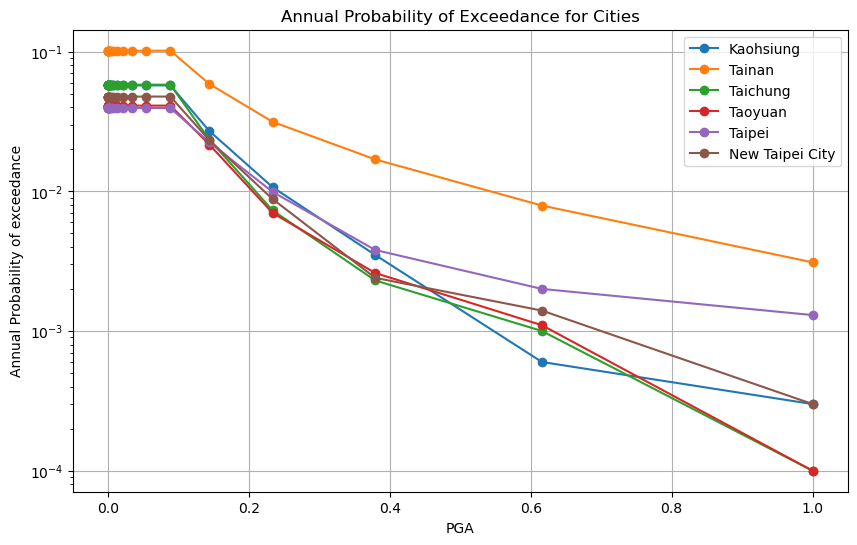

In [5]:
#Compute the annual probability of exceedance of intensities for each Lat, Long Point 
APEA_dic = Functions1.compute_APEA(erc_dict,time_frame_years)

# Assigning the APEA to each city based on the closest location
ListcityPoints2['APEA'] = ListcityPoints2.apply(lambda row: APEA_dic[Functions1.closest_point((row['lat'], row['lon']), APEA_dic.keys())], axis=1)
ListcityPoints2.head()


# Plot the exceedance rate curves
#vectorPGA = np.linspace(Min_intensity, Max_intensity, number_of_Points_ERC)  # just to Plot"
vectorPGA = np.logspace(np.log10(Min_intensity), np.log10(Max_intensity), number_of_Points_ERC)
#vectorPGA = [0.001, 0.1, 0.5]

for location, apea in APEA_dic.items():
    print(f'Location: {location}')
    print(f'Annual Probability of Exceedance: {apea}')
    break

# Create a figure and axes
fig2, ax2 = plt.subplots()

# Get the 10 curve before and afther the location with the maximun frec of ocurrence of the database 
# Extract the key with the maximum value
max_key = max(APEA_dic, key=lambda x: max(APEA_dic[x]))

# Once extracted the key with the max value, extract the index of the key with the maximum value
keys_list = list(APEA_dic.keys())
index_max_key = keys_list.index(max_key)

first_10 = list(APEA_dic.items())[index_max_key:index_max_key+10]
last_10 = list(APEA_dic.items())[index_max_key-10:index_max_key-1]

# Loop over each location and its exceedance rate curve
for location, apea in first_10 + last_10:
    # Plot the exceedance rate curve
    ax2.plot(vectorPGA, apea, label=f'Location: {location}')

# Set the title and labels
ax2.set_title('Annual Probability of Exceedance by Location')
ax2.set_xlabel('PGA')
ax2.set_ylabel('Annual Probability of Excedance')      #'Number of Events with PGA >= x' / event set size

ax2.set_yscale('log')

# Add a legend
ax2.legend()

# Show the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#Plot the exccedance rate curve for specific cities
plt.figure(figsize=(10, 6))
for index, row in ListcityPoints2.iterrows():
    plt.plot(vectorPGA, row['APEA'], label=row['city'], marker='o')

plt.title('Annual Probability of Exceedance for Cities')
plt.xlabel('PGA')
plt.ylabel('Annual Probability of exceedance')
plt.legend()
plt.grid(True)
plt.yscale('log')
plt.show()



In [6]:
# 2.3 Create the new folder where we save the output files
today = datetime.today()
outputrunid = today.strftime("%Y%m%d%H%M%S")
writepath = outpath + '/' + outputrunid
if config['outputs']['write']:
    print("  Writing outputs...", datetime.now())
    os.makedirs(writepath)
    #os.makedirs(writepath + '/' + 'Scenarios')
else:
    print("  Test run - no results written to file...", datetime.now())
    exit()

  Writing outputs... 2023-08-07 18:21:18.163578


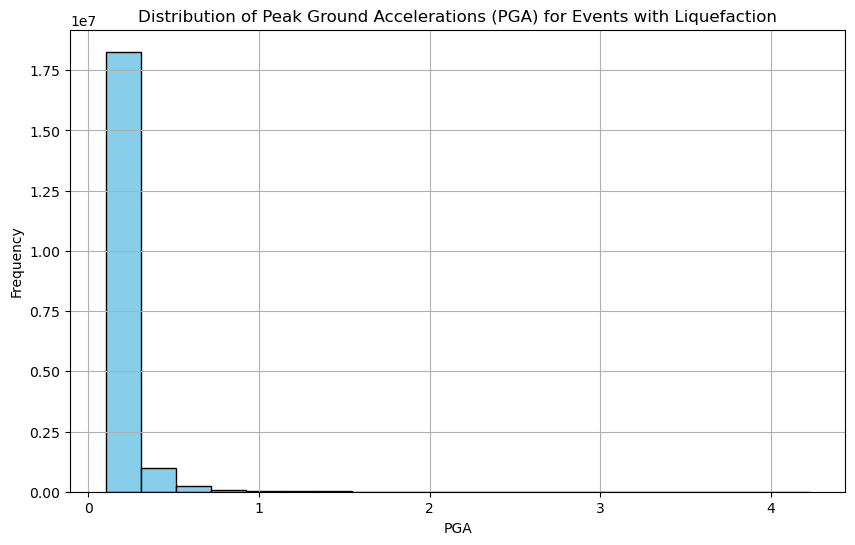

In [7]:
# Histogram for PGA_1
plt.figure(figsize=(10, 6))
plt.hist(combined_df['PGA'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Peak Ground Accelerations (PGA) for Events with Liquefaction')
plt.xlabel('PGA')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [8]:
#Histogram for Magnitude
#plt.figure(figsize=(10, 6))
#plt.hist(liquefaction_data['MAG_1'], bins=20, color='skyblue', edgecolor='black')
#plt.title('Distribution of Magnitud (Mw) for Events with Liquefaction')
#plt.xlabel('Magnitude (Mw)')
#plt.ylabel('Frequency')
#plt.grid(True)
#plt.show()

## Export the Results to csv file

In [9]:

#Excedance rate of Aceleration by location
#vectorPGA = [0.001, 0.1, 0.5]
#vectorPGA = np.linspace(Min_intensity, Max_intensity, number_of_Points_ERC)  # just to Plot"
vectorPGA = np.logspace(np.log10(Min_intensity), np.log10(Max_intensity), number_of_Points_ERC)

# Open a new CSV file
with open(writepath + '/' + 'Results' + '_ERC_EQ' + '.csv', 'w') as f:
    # Create a CSV writer
    writer = csv.writer(f)

    # Write the header
    #writer.writerow(['Lat', 'Long', 'ERC_0.001', 'ERC_0.1', 'ERC_0.5'])
    #Aux_header='Lat' + 'Long' + list(vectorPGA)
    writer.writerow(['Lat' , 'Long'] + list(vectorPGA))
    #writer.writerow(list(vectorPGA))

    # Loop over each item in the dictionary
    for location, erc in erc_dict.items():
        # Write the location and ERC to the CSV
        writer.writerow(list(location) + erc)


# Open a new CSV file
with open(writepath + '/' + 'Results' + '_AnnualProbEA_EQ' + '.csv', 'w') as f2:
    # Create a CSV writer
    writer = csv.writer(f2)

    # Write the header
    #writer.writerow(['Lat', 'Long', 'ERC_0.001', 'ERC_0.1', 'ERC_0.5'])
    #Aux_header='Lat' + 'Long' + list(vectorPGA)
    writer.writerow(['Lat' , 'Long'] + list(vectorPGA))
    #writer.writerow(list(vectorPGA))

    # Loop over each item in the dictionary
    for location, apea in APEA_dic.items():
        # Write the location and ERC to the CSV
        writer.writerow(list(location) + apea)


#Export ERC for specific cities/points
erc_columns = [f'ERC_PGA_{pga}' for pga in vectorPGA]
apea_columns = [f'APEA_PGA_{pga}' for pga in vectorPGA]

# Splitting the ERC list into separate columns
ListcityPoints[erc_columns] = pd.DataFrame(ListcityPoints['ERC'].tolist(), index=ListcityPoints.index)
ListcityPoints.drop(columns=['ERC'], inplace=True)

ListcityPoints2[apea_columns] = pd.DataFrame(ListcityPoints2['APEA'].tolist(), index=ListcityPoints2.index)
ListcityPoints2.drop(columns=['APEA'], inplace=True)

# Exporting the modified DataFrame to a .csv file
output_filename_name = 'Results_cities_ERC.csv'
ListcityPoints.to_csv(writepath + '/' + output_filename_name, index=False)

output_filename_name2 = 'Results_cities_APEA.csv'
ListcityPoints2.to_csv(writepath + '/' + output_filename_name2, index=False)



print("  Done.", datetime.now())

  Done. 2023-08-07 18:21:20.665811
